# Sentiment analysis on the Enron dataset <a class="tocSkip">

# What is sentiment analysis ?

## Definitions <a class="tocSkip">

Sentiment Analysis, also known as Opinion Mining, is the field within NLP that seeks to identify and extract opininons within text.

The interest is with:
+ Polarity: if the speaker express a positive or negative opinion, (polarity classification: pos, neg, neu)
+ Subject: the thing that is being talked about,
+ Opinion holder: the person, or entity that expresses the opinion. (subjectivity classification: subj, obj)

## Scope of sentiment analysis <a class="tocSkip">

+ Document level
+ Sentence level
+ Aspect-level (subsentence, certain subject etc)


# Imports

## Import dependencies

In [1]:
%%bash
ls -lh | grep .csv

-rw-r--r-- 1 1000 1000 1.4G Jun 16  2016 emails.csv
-rw-rw-r-- 1 1000 1000 355M Dec  9 10:59 emails.csv.zip


In [2]:
# built-in libs
import email

# processing libs
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

# display libs
from tqdm import tqdm_notebook

## Import data

In [3]:
emails_full_df = pd.read_csv('emails.csv', chunksize=10000)
emails_df = next(emails_full_df)

In [4]:
print(emails_df.shape)
emails_df.head()

(10000, 2)


,file,message
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...


In [5]:
emails_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
file       10000 non-null object
message    10000 non-null object
dtypes: object(2)
memory usage: 156.3+ KB


In [6]:
%time
messages_obj_lst = []
messages_str_lst = []

message_metadata = {}

for i in tqdm_notebook(range(emails_df.shape[0])):
    msg = email.message_from_string(emails_df.message[i])
    
    for msg_property in msg:
        if msg_property in message_metadata:
            message_metadata[msg_property][i] = msg[msg_property]
        else:
            message_metadata[msg_property] = ['N/A'] * emails_df.shape[0]
    
    payload = msg.get_payload() # decode=True
    
    messages_obj_lst.append(msg)
    messages_str_lst.append(payload) #.encode('utf-8').decode('unicode_escape')
    #except KeyboardInterrupt:
    #    break

print('messages_obj_lst size: %i' % len(messages_obj_lst))

CPU times: user 6 µs, sys: 2 µs, total: 8 µs
Wall time: 15.7 µs



messages_obj_lst size: 10000


In [7]:
# update dataframe object
# emails_df.rename(columns = {'message':'message_obj'}, inplace = True)
emails_df = emails_df.assign(message_obj = pd.Series(messages_obj_lst).values)
emails_df = emails_df.assign(payload     = pd.Series(messages_str_lst).values)

# print(emails_df.payload.str.contains(r'\\'))
emails_df['payload'] = emails_df.payload.str.replace(r'\n', '')

In [8]:
emails_df.head()

,file,message,message_obj,payload
0,allen-p/_sent_mail/1.,Message-ID: <18782981.1075855378110.JavaMail.e...,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Here is our forecast
1,allen-p/_sent_mail/10.,Message-ID: <15464986.1075855378456.JavaMail.e...,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Traveling to have a business meeting takes the...
2,allen-p/_sent_mail/100.,Message-ID: <24216240.1075855687451.JavaMail.e...,"[Message-ID, Date, From, To, Subject, Mime-Ver...",test successful. way to go!!!
3,allen-p/_sent_mail/1000.,Message-ID: <13505866.1075863688222.JavaMail.e...,"[Message-ID, Date, From, To, Subject, Mime-Ver...","Randy, Can you send me a schedule of the salar..."
4,allen-p/_sent_mail/1001.,Message-ID: <30922949.1075863688243.JavaMail.e...,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Let's shoot for Tuesday at 11:45.


In [9]:
del messages_obj_lst
del messages_str_lst

emails_df.drop('message', axis=1, inplace=True)

In [10]:
emails_df.head()

,file,message_obj,payload
0,allen-p/_sent_mail/1.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Here is our forecast
1,allen-p/_sent_mail/10.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Traveling to have a business meeting takes the...
2,allen-p/_sent_mail/100.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",test successful. way to go!!!
3,allen-p/_sent_mail/1000.,"[Message-ID, Date, From, To, Subject, Mime-Ver...","Randy, Can you send me a schedule of the salar..."
4,allen-p/_sent_mail/1001.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Let's shoot for Tuesday at 11:45.


# Fine-grained sentiment polarity - using nltk's Vader package

## VADER (Valence Aware Dictionary and sEntiment Reasoner) <a class="tocSkip">

is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media, and works well on texts from other domains.

In [11]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [12]:
sid = SentimentIntensityAnalyzer()

ss_lst = []
for i in tqdm_notebook(range(emails_df.shape[0])):
    ss = sid.polarity_scores(emails_df.payload.iloc[i])
    ss_lst.append(ss)
    
emails_df['sent_obj'] = ss_lst

In [13]:
emails_df.head()

,file,message_obj,payload,sent_obj
0,allen-p/_sent_mail/1.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Here is our forecast,"{'pos': 0.0, 'neu': 1.0, 'compound': 0.0, 'neg..."
1,allen-p/_sent_mail/10.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Traveling to have a business meeting takes the...,"{'pos': 0.114, 'neu': 0.886, 'compound': 0.931..."
2,allen-p/_sent_mail/100.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",test successful. way to go!!!,"{'pos': 0.539, 'neu': 0.461, 'compound': 0.688..."
3,allen-p/_sent_mail/1000.,"[Message-ID, Date, From, To, Subject, Mime-Ver...","Randy, Can you send me a schedule of the salar...","{'pos': 0.0, 'neu': 1.0, 'compound': 0.0, 'neg..."
4,allen-p/_sent_mail/1001.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Let's shoot for Tuesday at 11:45.,"{'pos': 0.0, 'neu': 0.676, 'compound': -0.34, ..."


In [14]:
emails_df['sent_pos'] = emails_df.apply(lambda x: x.sent_obj['pos'], axis=1)
emails_df['sent_neg'] = emails_df.apply(lambda x: x.sent_obj['neg'], axis=1)
emails_df['sent_neu'] = emails_df.apply(lambda x: x.sent_obj['neu'], axis=1)
emails_df['sent_comp'] = emails_df.apply(lambda x: x.sent_obj['compound'], axis=1)

emails_df.drop('sent_obj', axis=1, inplace=True)

In [15]:
emails_df.head()

,file,message_obj,payload,sent_pos,sent_neg,sent_neu,sent_comp
0,allen-p/_sent_mail/1.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Here is our forecast,0.000,0.000,1.000,0.0000
1,allen-p/_sent_mail/10.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Traveling to have a business meeting takes the...,0.114,0.000,0.886,0.9313
2,allen-p/_sent_mail/100.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",test successful. way to go!!!,0.539,0.000,0.461,0.6884
3,allen-p/_sent_mail/1000.,"[Message-ID, Date, From, To, Subject, Mime-Ver...","Randy, Can you send me a schedule of the salar...",0.000,0.000,1.000,0.0000
4,allen-p/_sent_mail/1001.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Let's shoot for Tuesday at 11:45.,0.000,0.324,0.676,-0.3400


In [16]:
emails_df[emails_df['sent_pos'] > 0.5].drop('message_obj', axis=1).head()

,file,payload,sent_pos,sent_neg,sent_neu,sent_comp
2,allen-p/_sent_mail/100.,test successful. way to go!!!,0.539,0.0,0.461,0.6884
90,allen-p/_sent_mail/176.,you have my approval,0.508,0.0,0.492,0.4767
250,allen-p/_sent_mail/320.,Please get with randy to resolve.,0.551,0.0,0.449,0.5994
333,allen-p/_sent_mail/402.,Thanks for your help.,0.737,0.0,0.263,0.6808
432,allen-p/_sent_mail/492.,yes please,1.000,0.0,0.000,0.6124


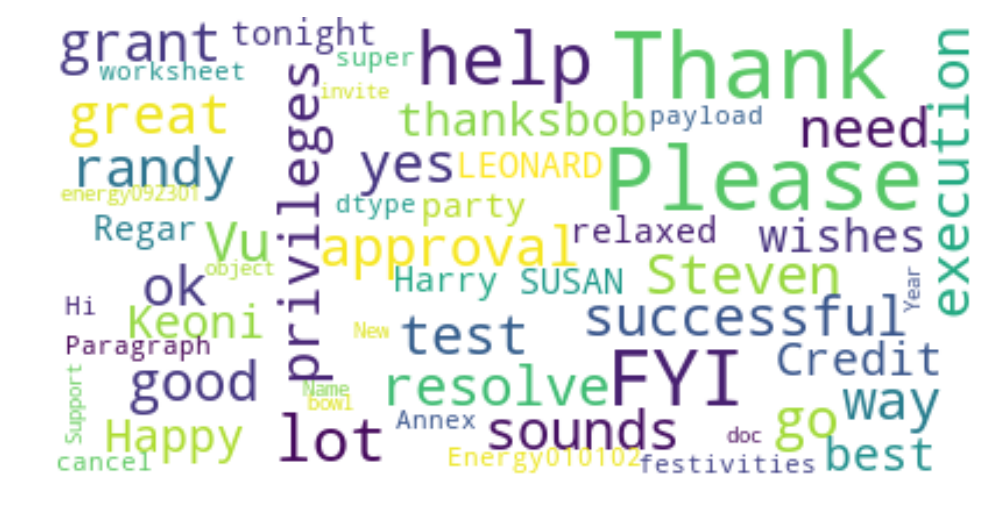

In [17]:
wordcloud = WordCloud(
    # width=1200, height=800,
    margin=0,
    background_color='white',
    stopwords=stopwords,
    max_words=200,
    max_font_size=40, 
    random_state=42
 ).generate(str(emails_df[emails_df['sent_pos'] > 0.5].payload))

plt.rcParams['figure.dpi'] = 600 #72
plt.rcParams['figure.figsize'] = (10,8)

# plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation='bilinear') #, interpolation='bilinear'
plt.axis('off')
plt.show()

In [18]:
emails_df[emails_df['sent_neg'] > 0.5].drop('message_obj', axis=1).head()

,file,payload,sent_pos,sent_neg,sent_neu,sent_comp
160,allen-p/_sent_mail/239.,no,0.0,1.0,0.0,-0.2960
353,allen-p/_sent_mail/420.,no problem,0.0,1.0,0.0,-0.5994
753,allen-p/all_documents/238.,no,0.0,1.0,0.0,-0.2960
972,allen-p/all_documents/437.,no problem,0.0,1.0,0.0,-0.5994
2567,allen-p/sent/192.,no,0.0,1.0,0.0,-0.2960


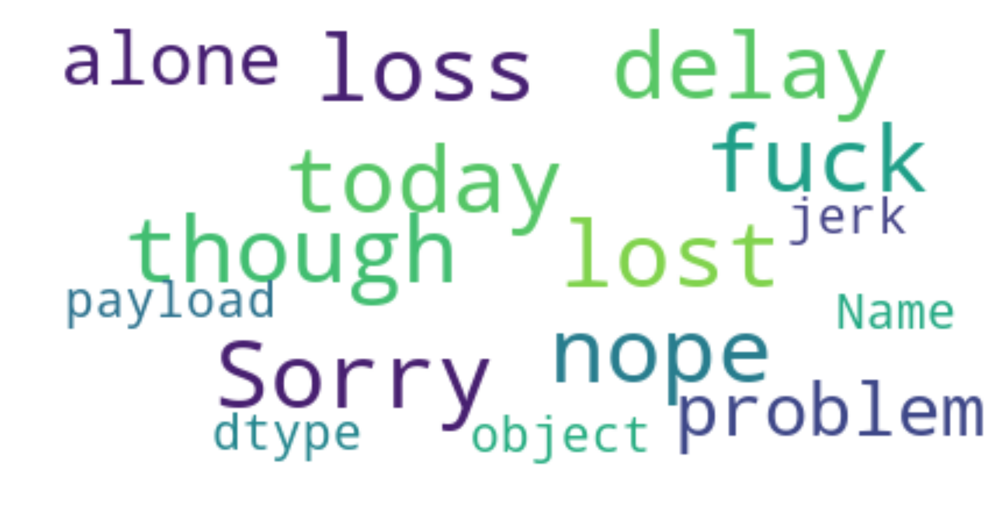

In [19]:
wordcloud = WordCloud(
    # width=1200, height=800,
    margin=0,
    background_color='white',
    stopwords=stopwords,
    max_words=200,
    max_font_size=40, 
    random_state=42
 ).generate(str(emails_df[emails_df['sent_neg'] > 0.5].payload))

plt.rcParams['figure.dpi'] = 600 #72
plt.rcParams['figure.figsize'] = (10,8)

print(wordcloud)
plt.imshow(wordcloud, interpolation='bilinear') #, interpolation='bilinear'
plt.axis('off')
plt.show()

# Sentiment polarity / subjectivity - using Textblob

In [20]:
from textblob import TextBlob

In [21]:
ss_lst = []

for i in tqdm_notebook(range(emails_df.shape[0])):
    ss = TextBlob(emails_df.payload.iloc[i]).sentiment
    ss_lst.append(ss)
    
emails_df['sent_obj'] = ss_lst

In [22]:
emails_df.head()

,file,message_obj,payload,sent_pos,sent_neg,sent_neu,sent_comp,sent_obj
0,allen-p/_sent_mail/1.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Here is our forecast,0.000,0.000,1.000,0.0000,"(0.0, 0.0)"
1,allen-p/_sent_mail/10.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Traveling to have a business meeting takes the...,0.114,0.000,0.886,0.9313,"(0.2, 0.5633333333333334)"
2,allen-p/_sent_mail/100.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",test successful. way to go!!!,0.539,0.000,0.461,0.6884,"(1.0, 0.95)"
3,allen-p/_sent_mail/1000.,"[Message-ID, Date, From, To, Subject, Mime-Ver...","Randy, Can you send me a schedule of the salar...",0.000,0.000,1.000,0.0000,"(0.0, 0.0)"
4,allen-p/_sent_mail/1001.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Let's shoot for Tuesday at 11:45.,0.000,0.324,0.676,-0.3400,"(0.0, 0.0)"


In [23]:
emails_df['sent_polarity'] = emails_df.apply(lambda x: x.sent_obj.polarity, axis=1)
emails_df['sent_subjectivity'] = emails_df.apply(lambda x: x.sent_obj.subjectivity, axis=1)

emails_df.drop('sent_obj', axis=1, inplace=True)

In [24]:
emails_df.head()

,file,message_obj,payload,sent_pos,sent_neg,sent_neu,sent_comp,sent_polarity,sent_subjectivity
0,allen-p/_sent_mail/1.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Here is our forecast,0.000,0.000,1.000,0.0000,0.0,0.000000
1,allen-p/_sent_mail/10.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Traveling to have a business meeting takes the...,0.114,0.000,0.886,0.9313,0.2,0.563333
2,allen-p/_sent_mail/100.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",test successful. way to go!!!,0.539,0.000,0.461,0.6884,1.0,0.950000
3,allen-p/_sent_mail/1000.,"[Message-ID, Date, From, To, Subject, Mime-Ver...","Randy, Can you send me a schedule of the salar...",0.000,0.000,1.000,0.0000,0.0,0.000000
4,allen-p/_sent_mail/1001.,"[Message-ID, Date, From, To, Subject, Mime-Ver...",Let's shoot for Tuesday at 11:45.,0.000,0.324,0.676,-0.3400,0.0,0.000000


In [25]:
emails_df[emails_df['sent_polarity'] >= 0.7].drop('message_obj', axis=1).head()

,file,payload,sent_pos,sent_neg,sent_neu,sent_comp,sent_polarity,sent_subjectivity
2,allen-p/_sent_mail/100.,test successful. way to go!!!,0.539,0.0,0.461,0.6884,1.0,0.95
127,allen-p/_sent_mail/209.,the merlin ct. address is still good. I don't...,0.172,0.0,0.828,0.4404,0.7,0.60
149,allen-p/_sent_mail/229.,"Jeff, I have spoken to Brenda and everything l...",0.042,0.0,0.958,0.2382,0.7,0.60
210,allen-p/_sent_mail/284.,"Mark, Thank you for the offer, but I am not do...",0.286,0.0,0.714,0.6808,0.7,0.60
273,allen-p/_sent_mail/342.,received the file. It worked. Good job.,0.326,0.0,0.674,0.4404,0.7,0.60


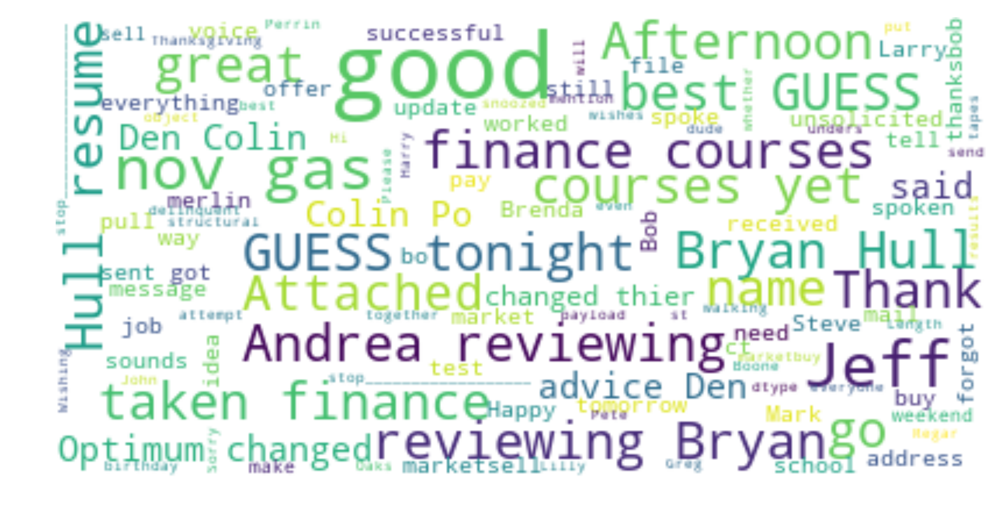

In [26]:
wordcloud = WordCloud(
    # width=1200, height=800,
    margin=0,
    background_color='white',
    stopwords=stopwords,
    max_words=200,
    max_font_size=40, 
    random_state=42
 ).generate(str(emails_df[emails_df['sent_polarity'] >= 0.7].payload))

plt.rcParams['figure.dpi'] = 600 #72
plt.rcParams['figure.figsize'] = (10,8)

print(wordcloud)
plt.imshow(wordcloud, interpolation='bilinear') #, interpolation='bilinear'
plt.axis('off')
plt.show()

In [27]:
emails_df[emails_df['sent_polarity'] < -0.8].drop('message_obj', axis=1).head()

,file,payload,sent_pos,sent_neg,sent_neu,sent_comp,sent_polarity,sent_subjectivity
3458,arnold-j/_sent_mail/478.,awfully close......,0.000,0.000,1.000,0.0000,-1.0,1.0
4587,arnold-j/all_documents/713.,awfully close......,0.000,0.000,1.000,0.0000,-1.0,1.0
5114,arnold-j/deleted_items/244.,just for that - you have to go get a beer with...,0.096,0.076,0.828,-0.1431,-0.9,0.7
5952,arnold-j/discussion_threads/471.,awfully close......,0.000,0.000,1.000,0.0000,-1.0,1.0
6853,arnold-j/sent_items/550.,I hated it-----Original Message-----From: Alle...,0.105,0.177,0.717,-0.4019,-0.9,0.7


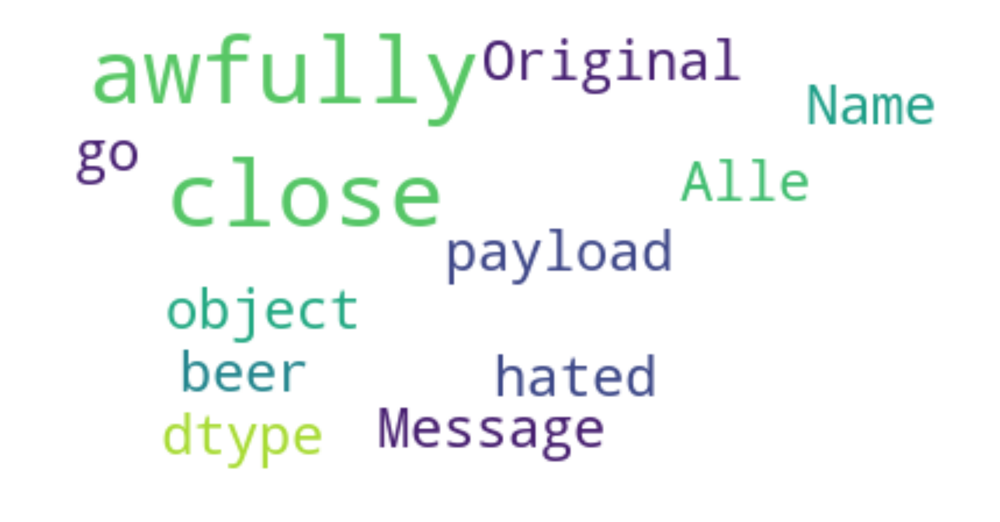

In [28]:
wordcloud = WordCloud(
    # width=1200, height=800,
    margin=0,
    background_color='white',
    stopwords=stopwords,
    max_words=200,
    max_font_size=40, 
    random_state=42
 ).generate(str(emails_df[emails_df['sent_polarity'] < -0.8].payload))

plt.rcParams['figure.dpi'] = 600 #72
plt.rcParams['figure.figsize'] = (10,8)

print(wordcloud)
plt.imshow(wordcloud, interpolation='bilinear') #, interpolation='bilinear'
plt.axis('off')
plt.show()

In [29]:
emails_df[emails_df['sent_subjectivity'] > 0.8].drop('message_obj', axis=1).head()

,file,payload,sent_pos,sent_neg,sent_neu,sent_comp,sent_polarity,sent_subjectivity
2,allen-p/_sent_mail/100.,test successful. way to go!!!,0.539,0.0,0.461,0.6884,1.0,0.950000
8,allen-p/_sent_mail/101.,1. login: pallen pw: ke9davis I don't think t...,0.000,0.0,1.000,0.0000,0.5,0.900000
39,allen-p/_sent_mail/13.,"Jim,Is there going to be a conference call or ...",0.071,0.0,0.929,0.3182,0.5,0.888889
44,allen-p/_sent_mail/134.,"Jeff, I need to see the site plan for Burnet. ...",0.111,0.0,0.889,0.6808,0.0,1.000000
45,allen-p/_sent_mail/135.,"Lucy,I want to have an accurate rent roll as s...",0.037,0.0,0.963,0.0772,0.2,0.816667


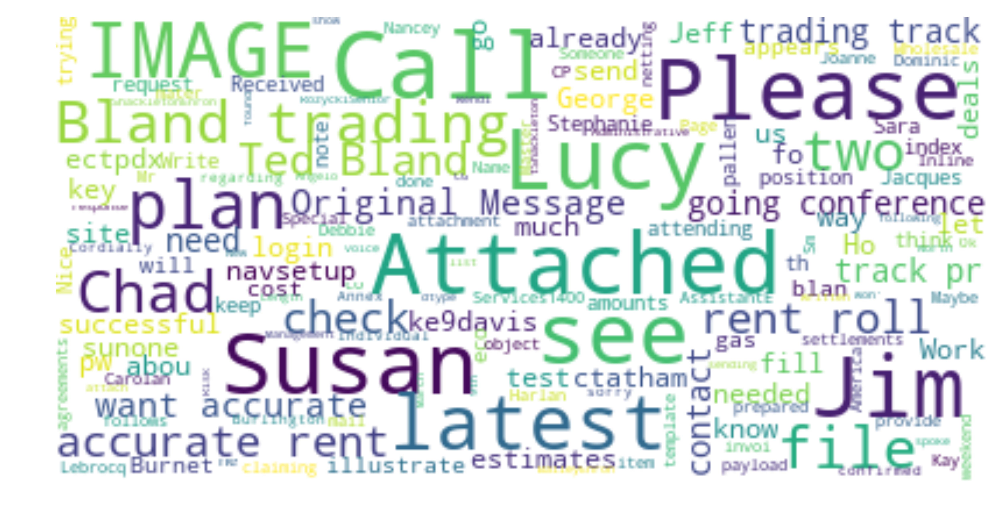

In [30]:
wordcloud = WordCloud(
    # width=1200, height=800,
    margin=0,
    background_color='white',
    stopwords=stopwords,
    max_words=200,
    max_font_size=40, 
    random_state=42
 ).generate(str(emails_df[emails_df['sent_subjectivity'] > 0.8].payload))

plt.rcParams['figure.dpi'] = 600 #72
plt.rcParams['figure.figsize'] = (10,8)

print(wordcloud)
plt.imshow(wordcloud, interpolation='bilinear') #, interpolation='bilinear'
plt.axis('off')
plt.show()

---